# Rede neural MLP com Keras TensorFlow
-----
Hugo Felipe Siqueira Costa - 01289269

José Vitor dos Santos - 01306023

Renato Loureiro de Lima - 01301758


### Carrega dataset do UCI
Utilizado Dataset wine-quality da UCI

In [1]:
!pip install pandas_profiling
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from pandas_profiling import ProfileReport
get_ipython().run_line_magic('matplotlib', 'inline')
from matplotlib import style
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

# Carrega o dataset do UCI
dataset = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv', delimiter=';')

dataset

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:

ProfileReport(dataset,title = "Pandas Profile Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [2]:
# Segundo o pandas profile não á valores faltantes no dataset, porém vamos executar a rotina para remover missing, nan, inf, caso haja
print('Tamanho do dataset:', len(dataset))

#Remove valores faltantes
dataset.dropna(inplace=True)
print('Tamanho do dataset após remover linhas com valores faltantes, nan, inf:', len(dataset))

Tamanho do dataset: 1599
Tamanho do dataset após remover linhas com valores faltantes, nan, inf: 1599


In [3]:
dataset.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [4]:
# Separa features e target
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']
target = 'quality'


In [5]:
# Frequencia das classes no target, 
dataset[target].value_counts()


5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

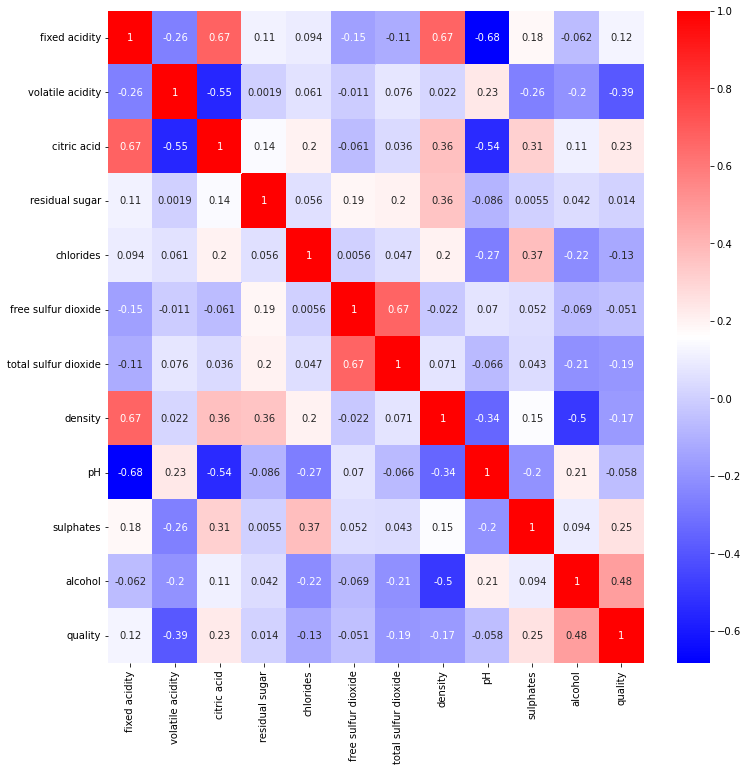

In [6]:
plt.figure(figsize=(12,12))
sns.heatmap(data=dataset.corr(), annot=True, cmap="bwr")
plt.show()

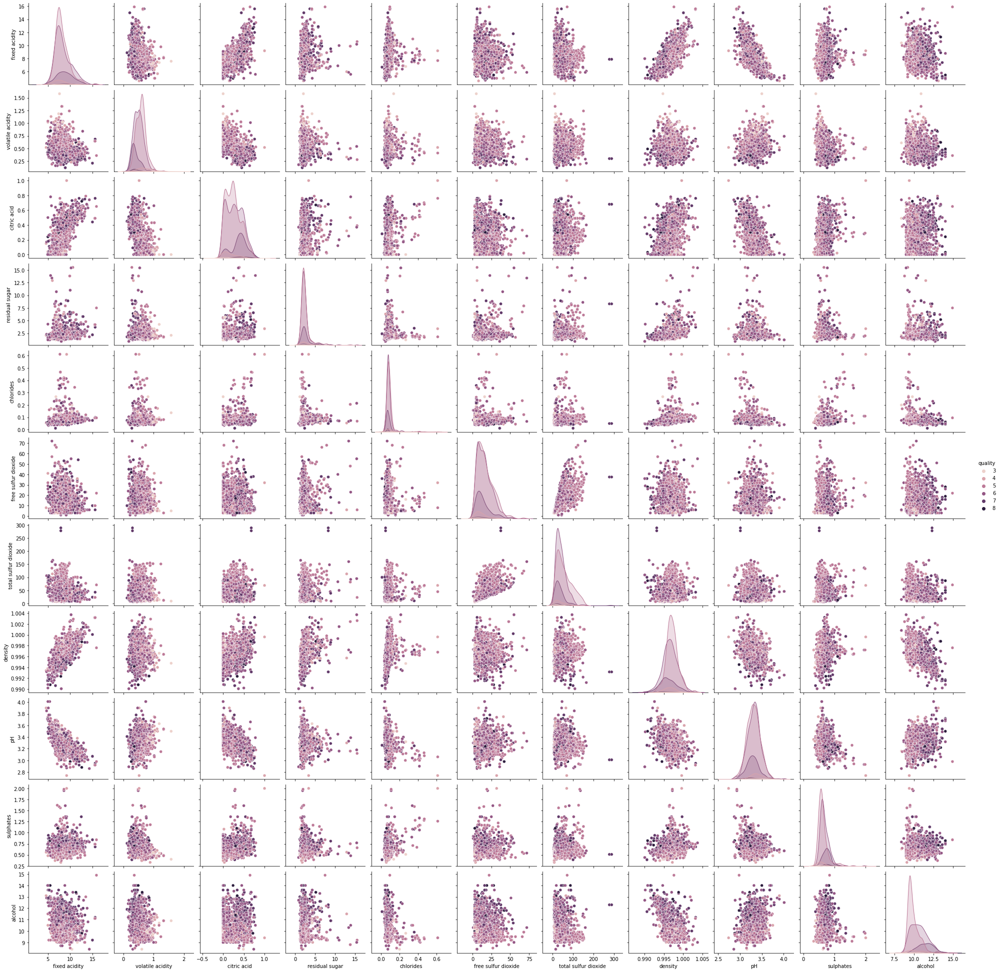

In [7]:
sns.pairplot(dataset, hue=target)
plt.show()

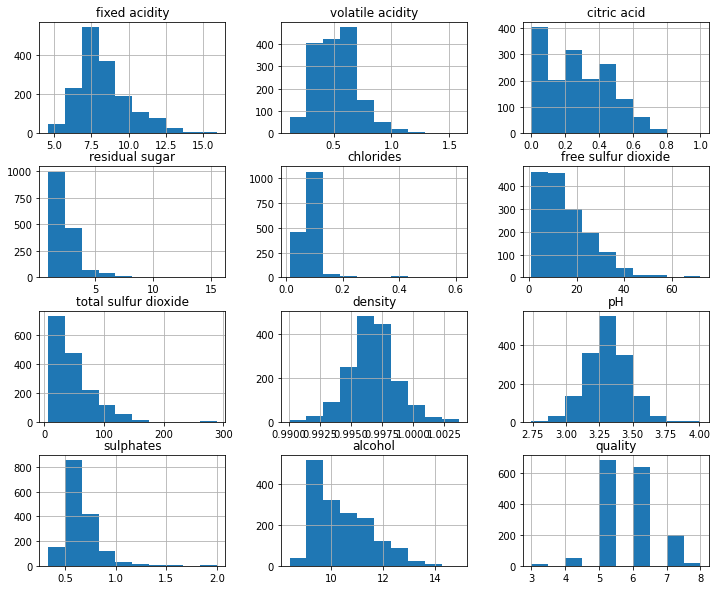

In [8]:
dataset.hist(bins=10,figsize=(12,10))
plt.show()

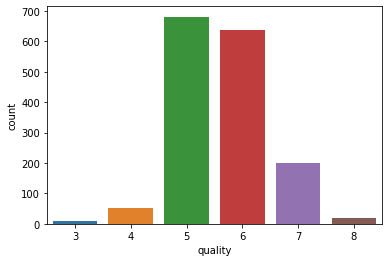

In [9]:
sns.countplot(x=target,data=dataset)
plt.show()

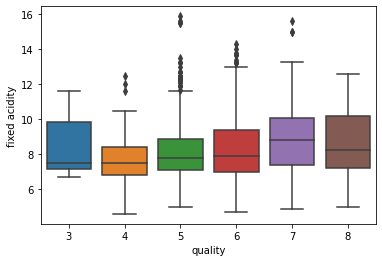

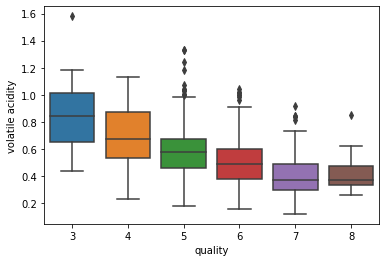

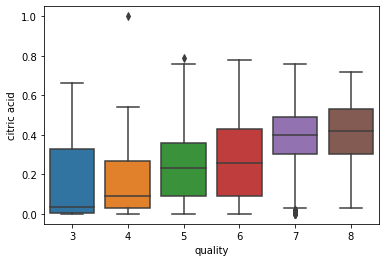

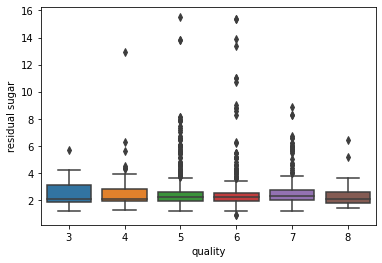

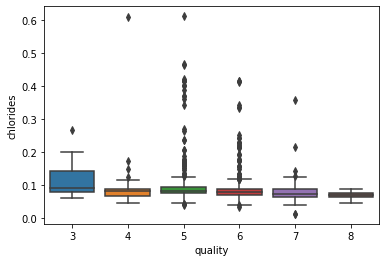

...

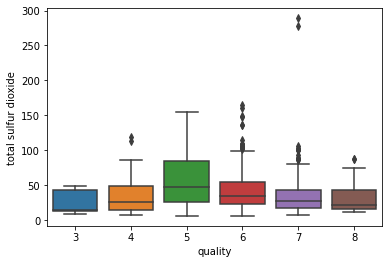

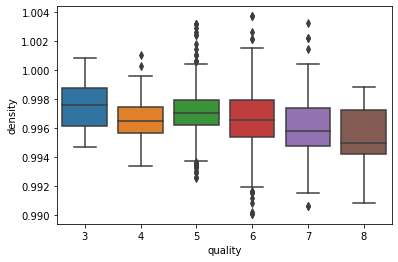

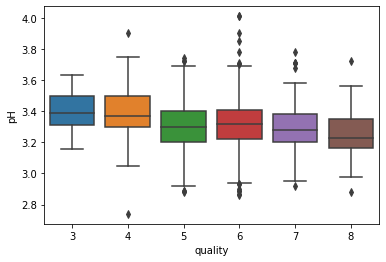

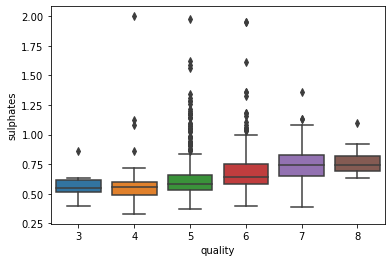

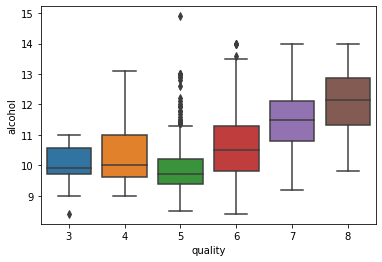

In [10]:
for feat in features:
    sns.boxplot(target, feat, data=dataset)
    plt.show()

In [11]:
from sklearn.model_selection import train_test_split

# Divide em entradas e target
X = dataset[features]
y = dataset[target]


### Verificação visual de outliers

Todas as variáveis possuem outliers

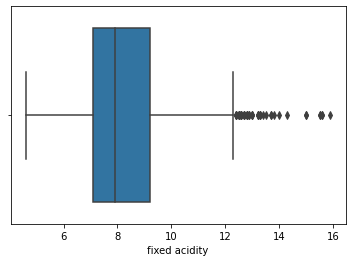

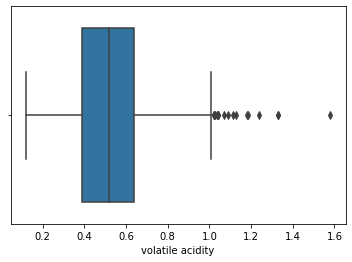

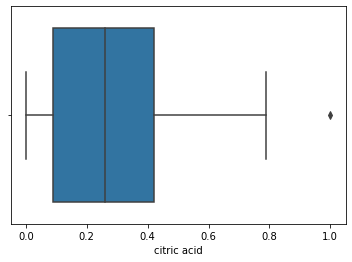

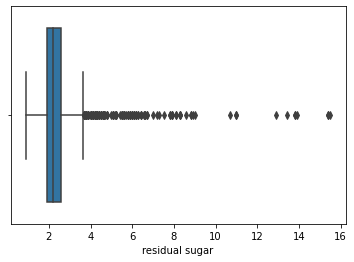

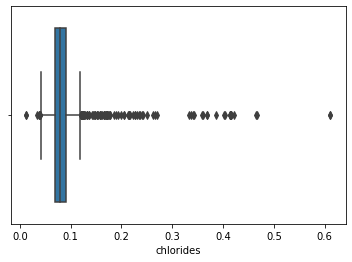

...

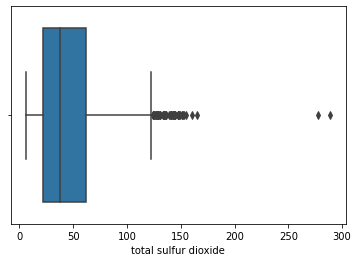

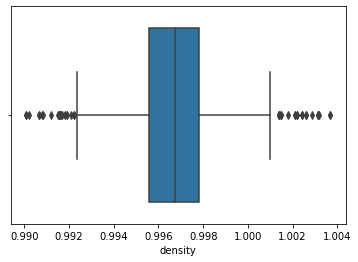

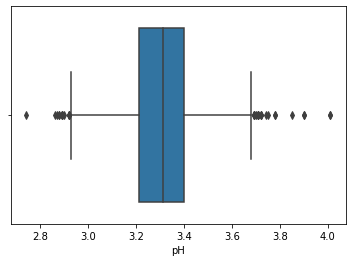

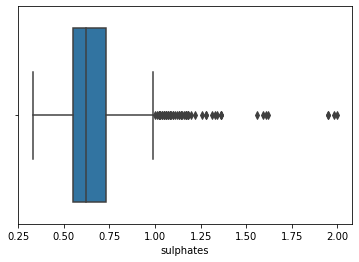

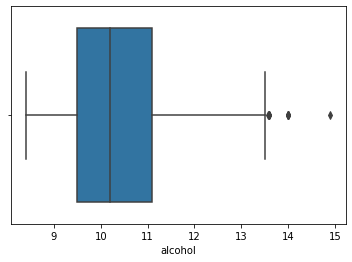

In [12]:
# Plotar boxplot para visualizar outliers
for feat in features:
    sns.boxplot(x=X[feat])
    plt.show()

### Divide, normaliza as features e binariza o target

In [13]:
# Divide em treino e teste
X_treino, X_teste, Y_treino, Y_teste = train_test_split(X, y, test_size = 0.30, random_state = 33)

# Dados de teste divididos em teste e validação 20%
X_treino, x_val, Y_treino, y_val = train_test_split(X_treino, Y_treino, test_size = 0.20, random_state = 33)

In [14]:
# Normaliza features
from sklearn.preprocessing import MinMaxScaler
scalerx = MinMaxScaler(feature_range=(0.1, 0.9))
x_treino_scalled = scalerx.fit_transform(X_treino.values)
x_val_scalled = scalerx.transform(x_val.values)


In [15]:
# Binariza target
from sklearn.preprocessing import LabelBinarizer
binarizery = LabelBinarizer()
y_treino_binarizado = binarizery.fit_transform(Y_treino.values)
y_val_bin = binarizery.transform(y_val.values)


### Configura rede neural

In [16]:
from keras.models import Sequential
from keras.layers import Activation, Dense, Input
from tensorflow.keras import layers
import tensorflow as tf
from keras.callbacks import ModelCheckpoint, Callback

# Configura entrada e saída
input_dim = x_treino_scalled.shape[1]
output_dim = y_treino_binarizado.shape[1]

# Configuração do modelo
mlp_clf = Sequential()

# 4 camadas com respectivamente 25, 50, 25, 10 neurônios ocultos, com ativação relu e softmax
mlp_clf = tf.keras.Sequential([
    tf.keras.layers.Dense(25, input_shape=(input_dim,), activation='relu'),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dense(25, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(output_dim, activation='softmax')
  ])

# Learning rate 0.02
tf.keras.optimizers.Adam(
    learning_rate=0.02,
    name='adam'
)

# Define semente para reprodutibilidade
tf.random.set_seed(
    seed=33
)


# Salva melhor configuração durante treino
checkpointer = ModelCheckpoint(filepath='temp',
                               verbose=1, 
                               save_best_only=True)

# Compila modelo
mlp_clf.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])


## Treinar rede neural

In [17]:
# Treina rede neural com 100 épocas
h = mlp_clf.fit(x_treino_scalled, y_treino_binarizado, validation_data=(x_val_scalled, y_val_bin), epochs=100, batch_size=20, callbacks=[checkpointer])

Epoch 1/1000
27/45 [=================>............] - ETA: 0s - loss: 1.7814 - acc: 0.3500 
Epoch 1: val_loss improved from inf to 1.72574, saving model to temp
INFO:tensorflow:Assets written to: temp/assets
45/45 [==============================] - 2s 29ms/step - loss: 1.7673 - acc: 0.3631 - val_loss: 1.7257 - val_acc: 0.3929
Epoch 2/1000
21/45 [=============>................] - ETA: 0s - loss: 1.6895 - acc: 0.4143
Epoch 2: val_loss improved from 1.72574 to 1.32626, saving model to temp
INFO:tensorflow:Assets written to: temp/assets
45/45 [==============================] - 1s 23ms/step - loss: 1.5917 - acc: 0.4101 - val_loss: 1.3263 - val_acc: 0.3929
Epoch 3/1000
38/45 [========================>.....] - ETA: 0s - loss: 1.1979 - acc: 0.4079
Epoch 3: val_loss improved from 1.32626 to 1.15519, saving model to temp
INFO:tensorflow:Assets written to: temp/assets
45/45 [==============================] - 1s 25ms/step - loss: 1.1898 - acc: 0.4112 - val_loss: 1.1552 - val_acc: 0.4152
Epoch 4/10

## Training history

A rede aumenta a acurácia, porém a acurácia de validação cai, sugerindo que o numero de épocas gera overfiting (algo que é minimizado salvando os checkpoints pelos dados de validação)

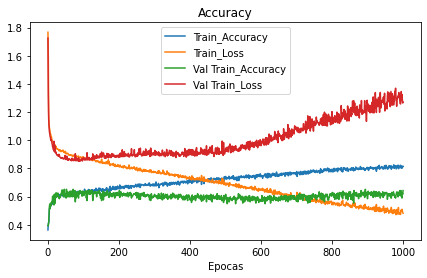

In [18]:
acc_ = h.history['acc']
loss_ = h.history['loss']
val_acc_ = h.history['val_acc']
val_loss_ = h.history['val_loss']
epc = np.arange(1, len(h.history['acc'])+1, 1).tolist()

plt.figure(figsize=(7, 4))
plt.plot(epc, acc_, label='Train_Accuracy')
plt.plot(epc, loss_, label='Train_Loss')
plt.plot(epc, val_acc_, label='Val Train_Accuracy')
plt.plot(epc, val_loss_, label='Val Train_Loss')
plt.xlabel('Epocas')
plt.title('Accuracy')
plt.legend()
plt.show()


## Predições

In [19]:
preds = mlp_clf.predict(scalerx.transform(X_teste.values))
preds

array([[3.5660507e-04, 5.7881590e-02, 9.3073124e-01, 1.0273052e-02,
        7.5763330e-04, 5.7236780e-12],
       [3.7730881e-17, 7.0792444e-02, 4.0161654e-02, 7.6212120e-01,
        1.2692457e-01, 6.1801636e-08],
       [4.4383421e-07, 1.9218050e-02, 3.6526045e-01, 5.7992500e-01,
        3.5596006e-02, 1.5023497e-08],
       ...,
       [1.8468746e-20, 1.4575920e-04, 5.6983554e-03, 7.4127573e-01,
        2.3798849e-01, 1.4891718e-02],
       [2.4228271e-12, 1.3904586e-02, 9.4439846e-01, 3.1847682e-02,
        9.8491060e-03, 8.3428461e-08],
       [2.4048620e-04, 1.7193960e-02, 7.5973886e-01, 2.2260939e-01,
        2.1732542e-04, 1.1830310e-10]], dtype=float32)

In [20]:
# Converte probabilidades para binários
bin_preds = np.zeros(preds.shape)
for pred, bin_pred in zip(preds, bin_preds):
    bin_pred[np.argmax(pred)] = 1
    
bin_preds

array([[0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       ...,
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.]])

In [21]:
# Converte para classes
preds_class = binarizery.inverse_transform(bin_preds)
preds_class

array([5, 6, 6, 5, 6, 5, 5, 6, 6, 5, 4, 6, 5, 6, 6, 5, 6, 4, 6, 5, 5, 7,
       5, 6, 5, 5, 6, 5, 5, 5, 6, 5, 5, 6, 6, 7, 5, 5, 6, 6, 5, 5, 5, 6,
       6, 6, 6, 6, 5, 5, 6, 5, 6, 5, 6, 6, 5, 4, 5, 6, 6, 5, 5, 4, 6, 6,
       5, 6, 6, 6, 6, 6, 4, 6, 6, 6, 6, 5, 6, 5, 6, 5, 5, 7, 6, 5, 5, 6,
       5, 5, 5, 5, 5, 6, 7, 5, 5, 6, 7, 5, 4, 5, 6, 6, 5, 5, 6, 7, 7, 6,
       6, 7, 5, 6, 5, 6, 5, 6, 6, 6, 6, 5, 4, 5, 5, 5, 6, 5, 5, 5, 5, 7,
       5, 6, 5, 5, 5, 5, 5, 7, 6, 7, 5, 6, 5, 6, 6, 6, 5, 5, 6, 6, 5, 5,
       5, 5, 7, 6, 7, 5, 5, 6, 6, 5, 7, 6, 5, 5, 5, 4, 5, 6, 6, 6, 5, 4,
       6, 6, 5, 5, 4, 5, 7, 6, 7, 6, 6, 5, 5, 5, 4, 6, 5, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5,
       7, 6, 6, 5, 7, 6, 5, 7, 7, 5, 6, 6, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6,
       5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 7, 5, 6, 5, 5, 6, 6, 6,
       6, 5, 6, 6, 5, 7, 6, 6, 5, 6, 6, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 6,
       6, 6, 5, 5, 6, 7, 5, 6, 5, 5, 5, 5, 5, 6, 6,

### Métricas

Acurácia geral dos dados de teste foi de 0.71, porém  a classe 2 apresenta acurácia 0. A explicação é que ela possui apenas 18 elemetos em todo dataset de 1599

In [22]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
print("Accuracy Score:", accuracy_score(preds_class, Y_teste))
print("classification Report:\n",classification_report(preds_class, Y_teste))

Accuracy Score: 0.5833333333333334
classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.27      0.29      0.28        14
           5       0.72      0.66      0.69       224
           6       0.58      0.54      0.56       199
           7       0.32      0.51      0.39        43
           8       0.00      0.00      0.00         0

    accuracy                           0.58       480
   macro avg       0.32      0.33      0.32       480
weighted avg       0.62      0.58      0.60       480



## Matriz de confusão

Text(42.0, 0.5, 'True label')

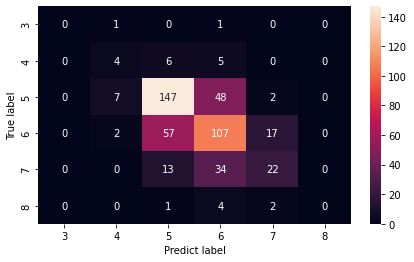

In [23]:
# Matriz de confusão
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Confusion matrix
plt.figure(figsize=(7, 4))
sns.heatmap(confusion_matrix(y_true=Y_teste.values, y_pred=preds_class), annot=True, fmt='g', xticklabels=list(binarizery.classes_), yticklabels=list(binarizery.classes_))
plt.xlabel('Predict label')
plt.ylabel('True label')

In [24]:
# Frequencia das classes no target, 
Y_teste.value_counts()


5    204
6    183
7     69
4     15
8      7
3      2
Name: quality, dtype: int64

# Segunda configuração da MLP
1. 3 camadas com respectivamente 25, 50, 10 neurônios ocultos, com ativação softmax e sigmoid
2. Learning rate 0.1

In [25]:

# Configuração do modelo
mlp_clf2 = Sequential()

# 3 camadas com respectivamente 25, 50, 10 neurônios ocultos, com ativação softmax e sigmoid
mlp_clf2 = tf.keras.Sequential([
    tf.keras.layers.Dense(25, input_shape=(input_dim,), activation='softmax'),
    tf.keras.layers.Dense(50, activation='sigmoid'),
    tf.keras.layers.Dense(10, activation='sigmoid'),
    tf.keras.layers.Dense(output_dim, activation='softmax')
  ])

# Learning rate 0.1
tf.keras.optimizers.Adam(
    learning_rate=0.1,
    name='adam'
)

# Define semente para reprodutibilidade
tf.random.set_seed(
    seed=33
)


# Salva melhor configuração durante treino
checkpointer2 = ModelCheckpoint(filepath='temp1',
                               verbose=1, 
                               save_best_only=True)

# Compila modelo
mlp_clf2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

In [27]:


# Treina rede neural com 100 épocas
h2 = mlp_clf2.fit(x_treino_scalled, y_treino_binarizado, validation_data=(x_val_scalled, y_val_bin), epochs=100, batch_size=20, callbacks=[checkpointer2])



Epoch 1/100
44/45 [============================>.] - ETA: 0s - loss: 0.9675 - acc: 0.6011
Epoch 1: val_loss did not improve from 0.93288
45/45 [==============================] - 2s 24ms/step - loss: 0.9677 - acc: 0.5978 - val_loss: 0.9368 - val_acc: 0.5804
Epoch 2/100
45/45 [==============================] - ETA: 0s - loss: 0.9670 - acc: 0.6011
Epoch 2: val_loss did not improve from 0.93288
45/45 [==============================] - 0s 11ms/step - loss: 0.9670 - acc: 0.6011 - val_loss: 0.9342 - val_acc: 0.5804
Epoch 3/100
36/45 [=======================>......] - ETA: 0s - loss: 0.9708 - acc: 0.5847
Epoch 3: val_loss improved from 0.93288 to 0.93213, saving model to temp1
INFO:tensorflow:Assets written to: temp1/assets
45/45 [==============================] - 3s 66ms/step - loss: 0.9669 - acc: 0.5911 - val_loss: 0.9321 - val_acc: 0.5893
Epoch 4/100
45/45 [==============================] - ETA: 0s - loss: 0.9671 - acc: 0.5966
Epoch 4: val_loss improved from 0.93213 to 0.93199, saving model

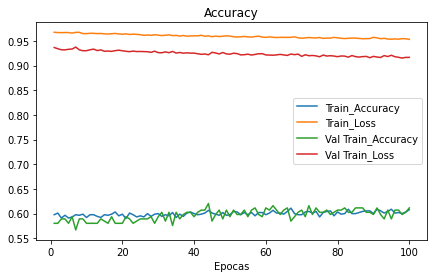

In [28]:


acc_2 = h2.history['acc']
loss_2 = h2.history['loss']
val_acc_2 = h2.history['val_acc']
val_loss_2 = h2.history['val_loss']
epc2 = np.arange(1, len(h2.history['acc'])+1, 1).tolist()

plt.figure(figsize=(7, 4))
plt.plot(epc2, acc_2, label='Train_Accuracy')
plt.plot(epc2, loss_2, label='Train_Loss')
plt.plot(epc2, val_acc_2, label='Val Train_Accuracy')
plt.plot(epc2, val_loss_2, label='Val Train_Loss')
plt.xlabel('Epocas')
plt.title('Accuracy')
plt.legend()
plt.show()




## Predições

In [29]:


preds2 = mlp_clf2.predict(scalerx.transform(X_teste.values))

# Converte probabilidades para binários
bin_preds2 = np.zeros(preds2.shape)
for pred2, bin_pred2 in zip(preds2, bin_preds2):
    bin_pred2[np.argmax(pred2)] = 1


# Converte para classes
preds_class2 = binarizery.inverse_transform(bin_preds2)


## Métricas

Acurácia geral dos dados de teste foi de 0.73, porém a classe 2 apresenta acurácia 0. A explicação é que ela possui apenas 18 elemetos em todo dataset de 1599


In [30]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
print("Accuracy Score:", accuracy_score(preds_class2, Y_teste))
print("classification Report:\n",classification_report(preds_class2, Y_teste))


Accuracy Score: 0.5791666666666667
classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.72      0.67      0.69       217
           6       0.67      0.50      0.57       245
           7       0.14      0.56      0.23        18
           8       0.00      0.00      0.00         0

    accuracy                           0.58       480
   macro avg       0.25      0.29      0.25       480
weighted avg       0.67      0.58      0.61       480



Text(42.0, 0.5, 'True label')

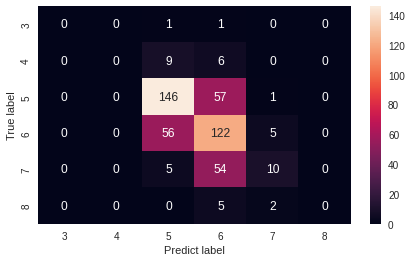

In [44]:
# Matriz de confusão
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Confusion matrix
plt.figure(figsize=(7, 4))
sns.heatmap(confusion_matrix(y_true=Y_teste.values, y_pred=preds_class2), annot=True, fmt='g', xticklabels=list(binarizery.classes_), yticklabels=list(binarizery.classes_))
plt.xlabel('Predict label')
plt.ylabel('True label')


In [43]:
# Frequencia das classes no target, 
Y_teste.value_counts()


5    204
6    183
7     69
4     15
8      7
3      2
Name: quality, dtype: int64

#Clusterização

In [32]:
dataset = dataset.drop('quality', axis=1)
dataset.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

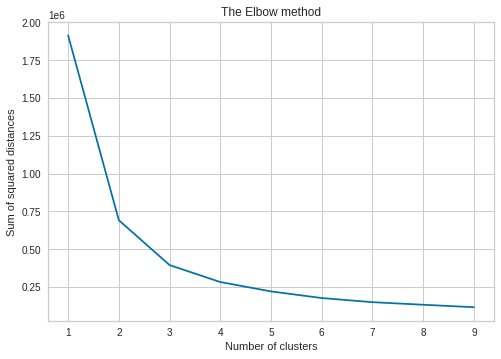

In [45]:
# Método do Elbow para encontrar a quantidade de clusters

wss=[]
for i in range(1,10):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(dataset)
    wss.append(kmeans.inertia_)
    
plt.plot(range(1,10), wss)
plt.title('The Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.show()

In [34]:
pip install yellowbrick

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


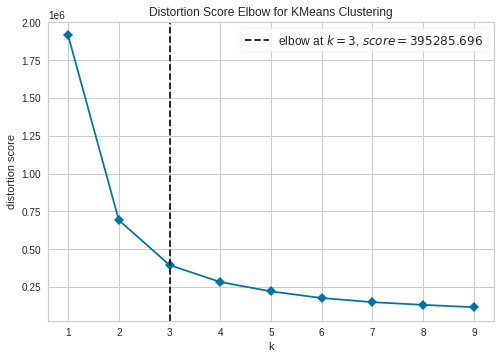

In [36]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10), timings = False)
visualizer.fit(dataset)
visualizer.show()

In [37]:
for i in range(2,10):
    kmeans = KMeans(n_clusters=i, max_iter=100)
    kmeans.fit(dataset)
    score = silhouette_score(dataset, kmeans.labels_)
    print("For cluster: {}, the silhouette score is: {}".format(i,score))

For cluster: 2, the silhouette score is: 0.6034220347331241
For cluster: 3, the silhouette score is: 0.5197446557038226
For cluster: 4, the silhouette score is: 0.48971967046233833
For cluster: 5, the silhouette score is: 0.44688878460464904
For cluster: 6, the silhouette score is: 0.44850222651946337
For cluster: 7, the silhouette score is: 0.3940373555812897
For cluster: 8, the silhouette score is: 0.39025280749537317
For cluster: 9, the silhouette score is: 0.36684196192302365


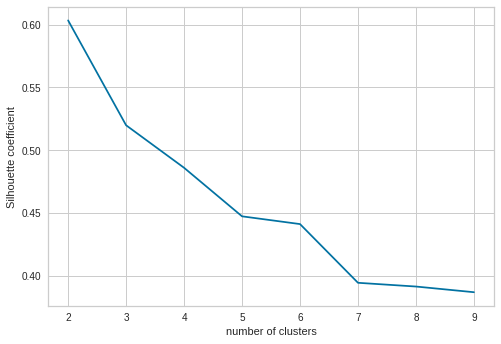

In [38]:
silhouette_coefficients = []
for i in range(2,10):
    kmeans = KMeans(n_clusters=i, max_iter=100)
    kmeans.fit(dataset)
    score = silhouette_score(dataset, kmeans.labels_)
    silhouette_coefficients.append(score)
    
plt.plot(range(2,10), silhouette_coefficients)
plt.xticks(range(2,10))
plt.xlabel("number of clusters")
plt.ylabel("Silhouette coefficient")
plt.show()

In [39]:
#PCA (Principal Component Analysis)

pca = PCA()

#Transformação de dados

X = pca.fit_transform(dataset)

In [40]:
#Inicializar objetos da classe

kmeans = KMeans(n_clusters=4)

label = kmeans.fit_predict(X)
unique_labels = np.unique(label)

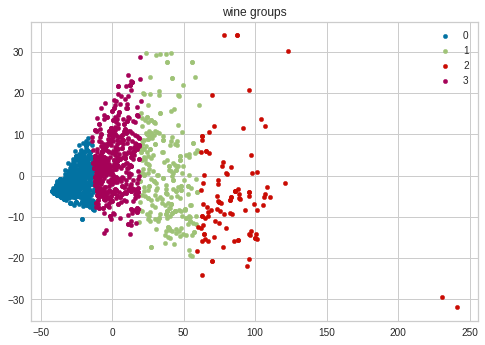

In [41]:
#Plotando os resultados

for i in unique_labels:
    plt.scatter(X[label==i,0], X[label==i,1], label=i, s=20)
    
plt.legend()
plt.title('wine groups')
plt.show()